In [1]:
#@title Install
!pip install -q ultralytics
!pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.7 MB/s eta 0:00:00


In [2]:
#@title Import
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
#@title Download Dataset
#this combines the dataset with just the ball
#and the one with the hoop and ball
from roboflow import Roboflow
rf = Roboflow(api_key="gOLOPfQX8gRjOtBtI3bQ")
project = rf.workspace("eagle-eye").project("basketball-1zhpe")
version = project.version(1)
dataset = version.download("yolov8")
project_hoop = rf.workspace("jack-gg6yw").project("basketball_and_hoop2")
version_hoop = project_hoop.version(4)
dataset_hoop = version_hoop.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Basketball-1 in yolov8:: 100%|██████████| 5210/5210 [00:00<00:00, 8451.24it/s]


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to basketball_and_hoop2-4 in yolov8:: 100%|██████████| 3700/3700 [00:00<00:00, 5979.10it/s]


In [ ]:
#@title Format Data
#these shell commands give us a directory structure like so:
#dataset
#   train
#       images
#       labels
#   test
#   valid

!rm -rf dataset

!mkdir dataset
!mkdir dataset/train
!mkdir dataset/test
!mkdir dataset/valid

!mkdir dataset/train/images
!mkdir dataset/valid/images
!mkdir dataset/test/images
!mkdir dataset/train/labels
!mkdir dataset/valid/labels
!mkdir dataset/test/labels

!cp ./Basketball-1/train/images/*.jpg ./dataset/train/images
!cp ./Basketball-1/valid/images/*.jpg ./dataset/valid/images
!cp ./Basketball-1/test/images/*.jpg ./dataset/test/images
!cp ./Basketball-1/train/labels/*.txt ./dataset/train/labels
!cp ./Basketball-1/valid/labels/*.txt ./dataset/valid/labels
!cp ./Basketball-1/test/labels/*.txt ./dataset/valid/labels
!cp ./basketball_and_hoop2-4/train/images/*.jpg ./dataset/train/images
!cp ./basketball_and_hoop2-4/valid/images/*.jpg ./dataset/valid/images
!cp ./basketball_and_hoop2-4/test/images/*.jpg ./dataset/test/images
!cp ./basketball_and_hoop2-4/train/labels/*.txt ./dataset/train/labels
!cp ./basketball_and_hoop2-4/valid/labels/*.txt ./dataset/valid/labels
!cp ./basketball_and_hoop2-4/test/labels/*.txt ./dataset/test/labels

!ls dataset/train/labels | wc -l
!ls dataset/valid/labels | wc -l
!ls dataset/test/labels | wc -l

3288
971
184


In [ ]:
#@title Consolidate Dataset
#we copy the dataset directory to datasets for ultralytics
!rm -rf datasets
!mkdir datasets
!cp -r ./dataset datasets

In [ ]:
#@title Data Setup for Ultralytics
#this sets up the yaml file for ultralytics
#the second dataset contains a third class that we do not need
#in inference, we ignore it
data_yaml = '''
names:
- ball
- hoop
- na
nc: 3
test: ./dataset/test/images
train: ./dataset/train/images
val: ./dataset/valid/images
'''
with open('data.yaml', 'w') as file:
    file.write(data_yaml)

In [1]:
#@title Model Construction
#this uses the small sized pretrained YOLOv8 model to start
model = YOLO("yolov8s")

NameError: name 'YOLO' is not defined

In [ ]:
#@title Training
#train the model using the yaml file we created
results = model.train(data="data.yaml", epochs=80, imgsz=640, name = 'bigimgsmall')

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=data.yaml, epochs=80, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=bigimgsmall3, exist_ok=False, pretrained=best.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True,

train: Scanning /content/datasets/dataset/train/labels... 3288 images, 38 backgrounds, 0 corrupt: 100%|██████████| 3288/3288 [00:02<00:00, 1139.88it/s]

train: New cache created: /content/datasets/dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/datasets/dataset/valid/labels... 499 images, 7 backgrounds, 0 corrupt: 100%|██████████| 499/499 [00:00<00:00, 888.46it/s]

val: New cache created: /content/datasets/dataset/valid/labels.cache


Plotting labels to runs/detect/bigimgsmall3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/bigimgsmall3
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      3.74G     0.7037     0.3966     0.9598         29        640:  15%|█▌        | 31/206 [00:06<00:38,  4.54it/s]


KeyboardInterrupt: 

In [ ]:
#@title Tensorboard
%load_ext tensorboard
%tensorboard --logdir runs/detect/bigimgsmall2

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
#@title Export
#this exports from torch to onnx to tflite
model.export(format="tflite")

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)

PyTorch: starting from 'best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (21.5 MB)

TensorFlow SavedModel: starting export with tensorflow 2.17.1...

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.42...
ONNX: export success ✅ 1.5s, saved as 'best.onnx' (42.8 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...
TensorFlow SavedModel: export success ✅ 19.3s, saved as 'best_saved_model' (106.9 MB)

TensorFlow Lite: starting export with tensorflow 2.17.1...
TensorFlow Lite: export success ✅ 0.0s, saved as 'best_saved_model/best_float32.tflite' (42.7 MB)

Export complete (19.7s)
Results saved to /content
Predict:         yolo predict task=detect model=best_saved_model/best_float32.tflite imgsz=640  
Validate:        yolo val task=detect model=best_saved_model/best_float32.tflite imgsz=640 data=data.yaml  
Visualize:       ht

'best_saved_model/best_float32.tflite'

In [ ]:
#@title Inference on Images
#this runs inference on some images from the test data
model = YOLO('best.pt')
import os
pred_results = []
filenames = os.listdir('dataset/test/images')
filenames = [os.path.join('dataset/test/images', filename) for filename in filenames]
#batch it into 64 per to speed things up
for i, filename in enumerate(range(len(filenames) // 64)):
    pred_results.append(model(filenames[i * 64:(i + 1) * 64], task = 'detect'))


0: 640x640 1 ball, 1 hoop, 4.5ms
1: 640x640 1 ball, 1 hoop, 4.5ms
2: 640x640 1 hoop, 4.5ms
3: 640x640 1 ball, 4.5ms
4: 640x640 1 ball, 4.5ms
5: 640x640 1 ball, 4.5ms
6: 640x640 1 ball, 4.5ms
7: 640x640 (no detections), 4.5ms
8: 640x640 1 ball, 4.5ms
9: 640x640 1 ball, 4.5ms
10: 640x640 1 ball, 2 hoops, 4.5ms
11: 640x640 1 ball, 4.5ms
12: 640x640 1 ball, 4.5ms
13: 640x640 1 ball, 4.5ms
14: 640x640 1 ball, 4.5ms
15: 640x640 1 ball, 1 hoop, 4.5ms
16: 640x640 1 ball, 4.5ms
17: 640x640 1 ball, 4.5ms
18: 640x640 1 ball, 4.5ms
19: 640x640 1 ball, 1 hoop, 4.5ms
20: 640x640 1 ball, 2 hoops, 4.5ms
21: 640x640 (no detections), 4.5ms
22: 640x640 1 ball, 4.5ms
23: 640x640 1 ball, 4.5ms
24: 640x640 1 ball, 4.5ms
25: 640x640 1 ball, 4.5ms
26: 640x640 1 ball, 1 hoop, 4.5ms
27: 640x640 1 ball, 4.5ms
28: 640x640 1 ball, 1 hoop, 4.5ms
29: 640x640 2 balls, 4.5ms
30: 640x640 1 hoop, 4.5ms
31: 640x640 1 hoop, 4.5ms
32: 640x640 1 hoop, 4.5ms
33: 640x640 1 hoop, 4.5ms
34: 640x640 1 ball, 4.5ms
35: 640x640 1 

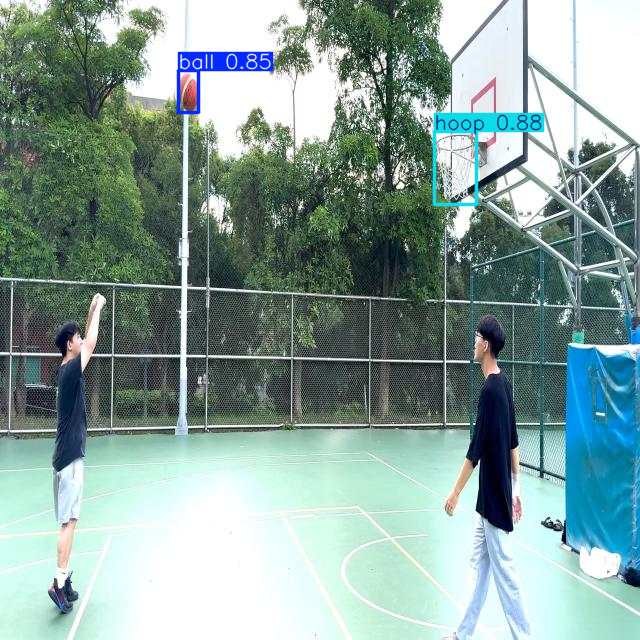

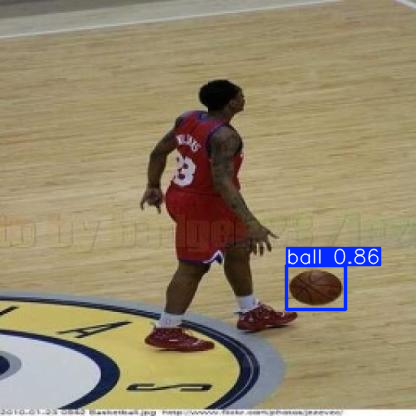

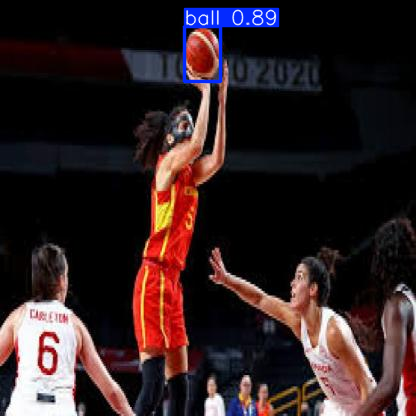

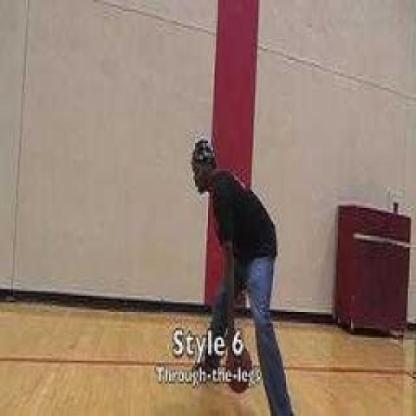

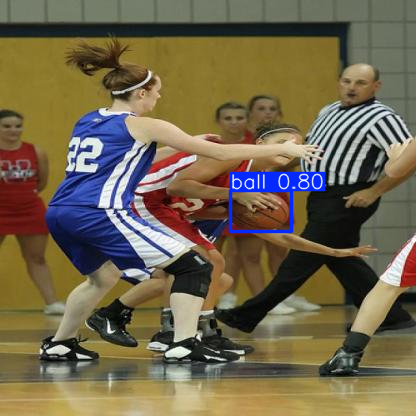

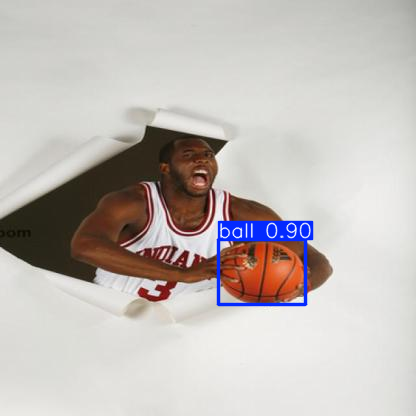

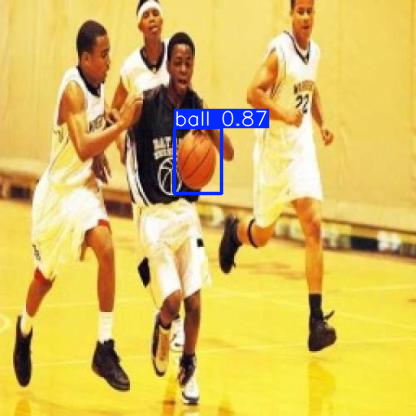

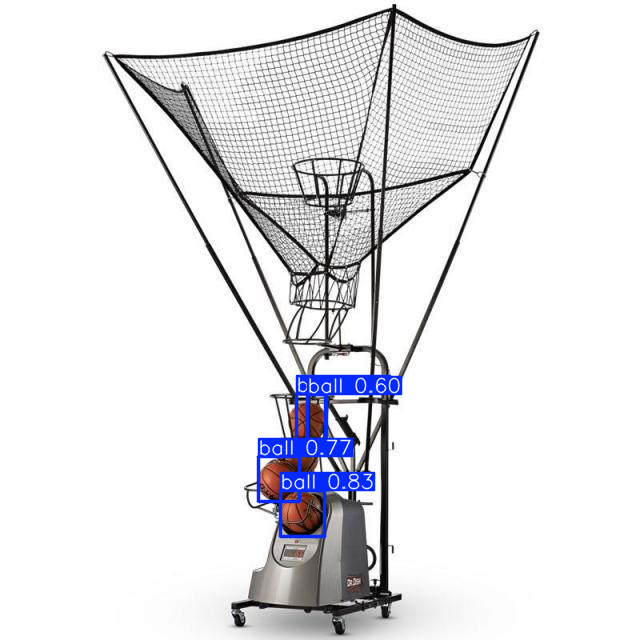

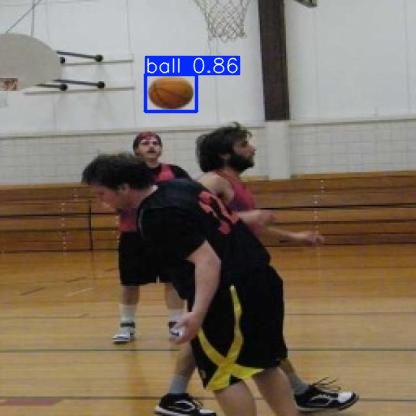

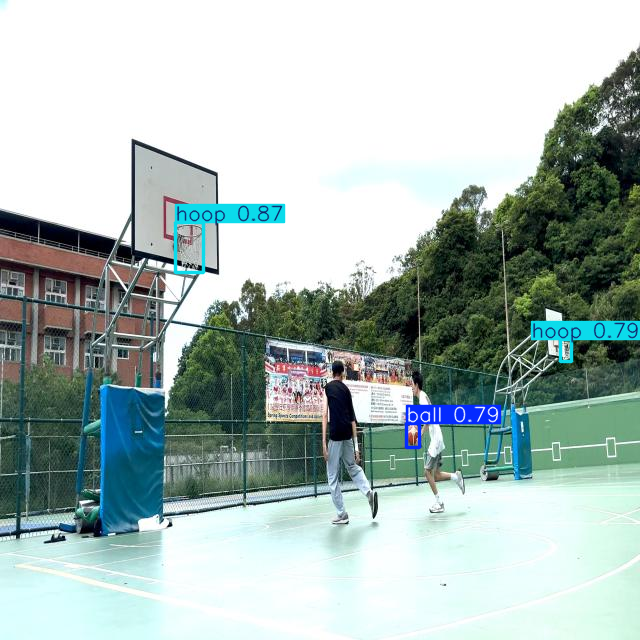

In [ ]:
#@title Python Model Visualization
#display the predicted frames using ultralytics
from google.colab.patches import cv2_imshow

for result_batch in pred_results:
    for result in result_batch:
        img = result.plot()
        cv2_imshow(img)
        break #remove this to show all the images

In [ ]:
#@title Check Example Inference
#see example prediction from ultralytics
print(pred_results[5][0].boxes)

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.9033], device='cuda:0')
data: tensor([[218.8118, 239.8030, 305.9781, 304.9307,   0.9033,   0.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (416, 416)
shape: torch.Size([1, 6])
xywh: tensor([[262.3949, 272.3668,  87.1664,  65.1277]], device='cuda:0')
xywhn: tensor([[0.6308, 0.6547, 0.2095, 0.1566]], device='cuda:0')
xyxy: tensor([[218.8118, 239.8030, 305.9781, 304.9307]], device='cuda:0')
xyxyn: tensor([[0.5260, 0.5764, 0.7355, 0.7330]], device='cuda:0')


In [5]:
#@title Infer on Video
import cv2
import numpy as np
import tensorflow as tf
import torch
from google.colab.patches import cv2_imshow

#runs inference on a video using ultra
#and save the resulting images to a video

!rm output.avi

video = cv2.VideoCapture('basketballshot2.mp4')
#this can be swapped with a pt file as well
model = YOLO('best_float32 (4).tflite', task = 'detect')

fourcc = cv2.VideoWriter_fourcc(*'XVID')

fps = 30
frame = video.read()[1].shape
height, width, _ = frame
out = cv2.VideoWriter('output.avi', fourcc, fps, (width, height))

frames = []
while True:
    ret, frame = video.read()
    if not ret:
        break
    frames.append(frame)

print(len(frames))

BATCH_AMOUNT = 1
#again we batch the input
#since we are loading the tflite model, we can only
#do a size of one but if we loaded it from .pt
#we could use an actual batch size
for i in range(len(frames) // BATCH_AMOUNT):
    frame_set = frames[i * BATCH_AMOUNT:(i + 1) * BATCH_AMOUNT]
    outputs = model(frame_set, task = 'detect')
    for output in outputs:
        img = output.plot()
        out.write(img)

Loading best_float32 (4).tflite for TensorFlow Lite inference...

0: 640x640 1 ball, 1 hoop, 503.8ms
Speed: 2.7ms preprocess, 503.8ms inference, 40.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 ball, 1 hoop, 489.6ms
Speed: 2.3ms preprocess, 489.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 ball, 1 hoop, 489.2ms
Speed: 2.3ms preprocess, 489.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 ball, 1 hoop, 489.9ms
Speed: 2.8ms preprocess, 489.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 ball, 1 hoop, 498.7ms
Speed: 2.4ms preprocess, 498.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 ball, 1 hoop, 505.7ms
Speed: 2.3ms preprocess, 505.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 ball, 1 hoop, 501.9ms
Speed: 2.3ms preprocess, 501.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 6

In [4]:
#@title Infer on Video without Ultra
import cv2
import numpy as np
import tensorflow as tf

#this runs the results without using ultra
#and instead using our custom logic

interpreter = tf.lite.Interpreter(model_path="best_float32 (4).tflite")
interpreter.allocate_tensors()

video = cv2.VideoCapture('basketballshot2.mp4')

inf_results = []
while True:
    ret, frame = video.read()
    if not ret:
        break
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame, (640, 640))
    frame = np.array(frame, dtype = np.float32) / 255
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    input_shape = input_details[0]['shape']
    input_data = frame.astype(np.float32)
    input_data = np.expand_dims(input_data, axis=0)
    interpreter.set_tensor(input_details[0]['index'], input_data)
    interpreter.invoke()
    output_data = interpreter.get_tensor(output_details[0]['index'])
    inf_results.append(output_data)

In [2]:
#@title Visualization Helper

#this is our custom nms function
def raw_nms(outputs, conf_thresh, iou_thresh = 0.5):
    outputs = outputs.transpose(0, 2, 1)

    out = outputs[0]
    scores = out[:, 4:].max(-1)
    keep = scores > conf_thresh
    boxes = out[keep, :4]
    scores = scores[keep]
    class_ids = out[keep, 4:].argmax(-1)

    if len(boxes) == 0:
        return [], [], []

    print(len(scores), 'surviving candidates')

    indices = cv2.dnn.NMSBoxes(boxes, scores, conf_thresh, iou_thresh)[0].flatten()
    print(len(indices))
    print(max(scores[indices]))
    print(min(scores[indices]))

    return boxes[indices], scores[indices], class_ids[indices]


In [8]:
#@title Visualize Results
from google.colab.patches import cv2_imshow

!rm tflite_output.avi

#this saves the results just like before to a video
#however this time it uses our logic

CONF_THRESH = 0.1
names = ['ball', 'hoop', 'na']

video = cv2.VideoCapture('basketballshot2.mp4')
ret, frame = video.read()

height, width, _ = frame.shape

fourcc = cv2.VideoWriter_fourcc(*'XVID')

fps = 30
frame = video.read()[1].shape

out = cv2.VideoWriter('tflite_output.avi', fourcc, fps, (width, height))

colors = [
    (255, 0, 0),
    (0, 255, 0),
    (0, 0, 255)
]

video = cv2.VideoCapture('basketballshot2.mp4')

N = 1
#every Nth frame
for i in range(1, 1000, N):
    if i >= len(inf_results):
        break
    bboxes = inf_results[i][0][:4].transpose()
    classes = inf_results[i][0][4:].transpose()

    ret, frame = video.read()
    if not ret:
        break

    boxes, scores, classes = raw_nms(inf_results[i], CONF_THRESH)
    # boxes, scores, classes = raw_nms(tflite_raw_output, CONF_THRESH)
    detected = False

    for i, (bbox, score, cls) in enumerate(zip(boxes, scores, classes)):
        #convert from (cx, cy, w, h) to (x1, y1, x2, y2)
        x1 = bbox[0] - (0.5 * bbox[2])
        y1 = bbox[1] - (0.5 * bbox[3])
        x2 = bbox[0] + (0.5 * bbox[2])
        y2 = bbox[1] + (0.5 * bbox[3])
        print(bbox)
        if cls == 2:
            print('e')
            continue
        #use if we don't need to convert
        # x1, y1, x2, y2 = bbox

        x1 = int(x1 * width)
        y1 = int(y1 * height)
        x2 = int(x2 * width)
        y2 = int(y2 * height)

        cv2.rectangle(
            frame,
            (x1, y1),
            (x2, y2),
            color=colors[cls],
            thickness=2
        )
        cv2.imwrite('output.jpg', frame)
        detected = True

    if detected:
        result_frame = cv2.imread('output.jpg')
        out.write(result_frame)
    else:
        print('no detection at confidence of', CONF_THRESH)

23 surviving candidates
1
0.76479214
0.76479214
[0.838315   0.7499094  0.04523546 0.06920481]
24 surviving candidates
1
0.7466552
0.7466552
[0.8413272  0.74660325 0.04401416 0.06695181]
24 surviving candidates
1
0.7436659
0.7436659
[0.84135234 0.7465878  0.04408544 0.06709075]
22 surviving candidates
1
0.76478153
0.76478153
[0.8424068  0.7422694  0.0419302  0.06264204]
23 surviving candidates
1
0.75960004
0.75960004
[0.84222126 0.74235326 0.04139537 0.06241596]
23 surviving candidates
1
0.7657616
0.7657616
[0.8422282  0.7424685  0.04106307 0.06174469]
25 surviving candidates
1
0.78783405
0.78783405
[0.8408345  0.74104184 0.03900653 0.05831921]
25 surviving candidates
1
0.7903157
0.7903157
[0.8408128  0.7410525  0.03899992 0.05822659]
25 surviving candidates
1
0.79564536
0.79564536
[0.8408321  0.7415805  0.03879476 0.05806226]
25 surviving candidates
1
0.7956804
0.7956804
[0.8408307  0.74158263 0.03879768 0.05806798]
25 surviving candidates
1
0.79509366
0.79509366
[0.8408044  0.7415791 